In [2]:
import os

# os.environ['HDF5_USE_FILE_LOCKING'] = 'FALSE'
# os.environ["CUDA_VISIBLE_DEVICES"]="0"

import numpy as np
import torch
import torch.utils.data
from PIL import Image

import cv2

import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor

from glob import glob
from tqdm.autonotebook import tqdm

import torch.nn as nn
import torch.nn.functional as F

import open3d as o3d

import trimesh

import multiprocessing as mp

import yaml

import matplotlib.pyplot as plt

import h5py

import random

import roma

# from epd import *
from tqdm.autonotebook import tqdm
import scipy

device = 'cuda'
import copy

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


## Load Preprocessed Data

In [3]:
hf = h5py.File('processed_data_subs.h5', 'r')
rgbs = hf['rgbs'][:]
depth_imgs = hf['depth_imgs'][:]
merged_masks = hf['merged_masks'][:]
point_cloud_pairs = np.load('point_cloud_pairs.npy',allow_pickle=True)
gt = np.load('custom_gt.npy',allow_pickle=True).item()

In [4]:
obj_mask_value = {14: 0, 28: 1, 42: 2, 56: 3, 70: 4, 85: 5, 99: 6, 113: 7, 127: 8, 141: 9, 155: 10, 170: 11, 184: 12, 198: 13, 212: 14, 226: 15, 240: 16, 255: 17}
obj_to_mask_value = {v: k for k, v in obj_mask_value.items()}

reference_point_clouds = np.load('reference_point_clouds_custom.npy',allow_pickle=True)

## Visualize Data

### Reference Point Clouds

In [5]:
scene = trimesh.Scene()
for i,pc in enumerate(reference_point_clouds):
    scene.add_geometry(trimesh.points.PointCloud(pc[0]*1000 + [i%6 * 300, i//6 * 300 ,0],colors=pc[1]))
scene.camera.z_far = 10
scene.show(viewer='notebook')

In [6]:
diameters = []
for i in range(len(reference_point_clouds)):
    diameters.append(float(torch.cdist(torch.Tensor(reference_point_clouds[i][0]),torch.Tensor(reference_point_clouds[i][0])).max().detach().numpy())*1000.0)

In [7]:
idx_list = []
for i in gt.keys():
    idx_list += [i] * len(gt[i])

### Sample Data

In [8]:
rind = np.random.choice(8000)
point_cloud_pair = point_cloud_pairs[rind]
rgb = rgbs[idx_list[rind]]
merged_mask = merged_masks[idx_list[rind]]
depth_img = depth_imgs[idx_list[rind]]

(-0.5, 639.5, 479.5, -0.5)

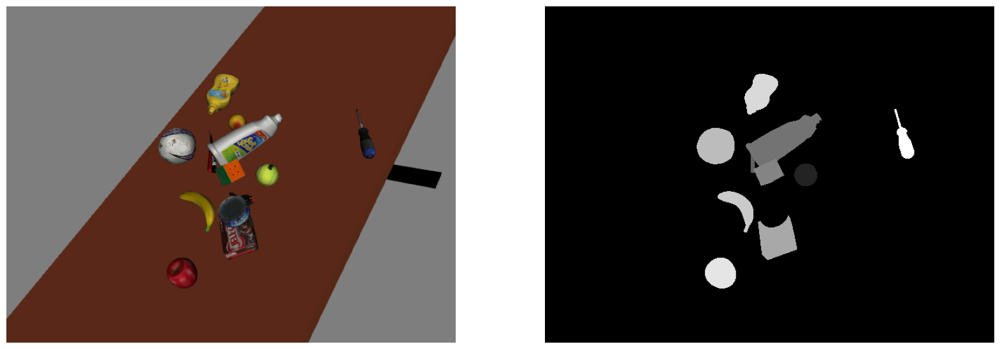

In [9]:
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
plt.imshow(rgb)
plt.axis('off')
plt.subplot(1,2,2)
plt.imshow(merged_mask,cmap='Greys_r')
plt.axis('off')

In [10]:
scene = trimesh.Scene()
dp_i = np.copy(depth_img[:,:,0:3])
dp_i[np.isnan(dp_i)] = 0.0
scene.add_geometry(trimesh.points.PointCloud(dp_i.reshape([-1,3])*1000.0,colors=rgb.reshape([-1,3])))
scene.camera.z_far = 10
scene.show(viewer='notebook')

In [11]:
scene = trimesh.Scene()
# obj_id_list = list(id_to_name.keys())

pc_source = trimesh.points.PointCloud(point_cloud_pair[0],colors=point_cloud_pair[1])
scene.add_geometry(pc_source)

r_pc = np.copy(reference_point_clouds[point_cloud_pair[2]-1][0])
r_pc = (np.reshape(point_cloud_pair[3],(3,3)) @ r_pc.T).T + point_cloud_pair[4]
pc_target = trimesh.points.PointCloud(r_pc,colors=[0,255,0])
scene.add_geometry(pc_target)

scene.camera.z_far = 10
scene.show(viewer='notebook')

## Instance Segmentaion Training

In [12]:
class ManipulationDataset(torch.utils.data.Dataset):
    def __init__(self, root, transforms=None):
        self.root = root
        self.transforms = transforms
        # load all image files, sorting them to
        # ensure that they are aligned
        self.imgs = list(range(len(rgbs)))
        self.masks = list(range(len(rgbs)))
        
        self.obj_id_dict = {0: '055_baseball', 1: '056_tennis_ball', 2: '072-a_toy_airplane', 3: '019_pitcher_base', 4: '040_large_marker', 5: '021_bleach_cleanser', 6: '077_rubiks_cube', 7: '048_hammer', 8: '008_pudding_box', 9: '053_mini_soccer_ball', 10: '011_banana', 11: '006_mustard_bottle', 12: '013_apple', 13: '029_plate', 14: '035_power_drill', 15: '043_phillips_screwdriver', 16: '032_knife', 17: '042_adjustable_wrench'}
        self.obj_mask_value = {14: 0, 28: 1, 42: 2, 56: 3, 70: 4, 85: 5, 99: 6, 113: 7, 127: 8, 141: 9, 155: 10, 170: 11, 184: 12, 198: 13, 212: 14, 226: 15, 240: 16, 255: 17}
        
    def __getitem__(self, idx):
        # load images ad masks
        # img_path = os.path.join(self.root, "rgb", self.imgs[idx])
        # mask_path = os.path.join(self.root, "merged_masks", self.masks[idx])
        img = torch.Tensor(np.transpose(rgbs[self.imgs[idx]],[2,0,1]))
        # note that we haven't converted the mask to RGB,
        # because each color corresponds to a different instance
        # with 0 being background
        mask = merged_masks[self.masks[idx]]

        # instances are encoded as different colors
        obj_ids = np.unique(mask)
        # first id is the background, so remove it
        obj_ids = obj_ids[1:]

        # split the color-encoded mask into a set
        # of binary masks
        masks = mask == obj_ids[:, None, None]
        
        
        
        # get bounding box coordinates for each mask
        num_objs = len(obj_ids)
        
        labels = torch.zeros((num_objs,), dtype=torch.int64)
        
        boxes = []
        for i in range(num_objs):
            pos = np.where(masks[i])
            xmin = np.min(pos[1])
            xmax = np.max(pos[1])
            ymin = np.min(pos[0])
            ymax = np.max(pos[0])
            boxes.append([xmin, ymin, xmax, ymax])

            labels[i] = self.obj_mask_value[obj_ids[i]] + 1

        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        
        masks = torch.as_tensor(masks, dtype=torch.uint8)

        image_id = torch.tensor([idx])
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        
        iscrowd = torch.zeros((num_objs,), dtype=torch.int64)
        
        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["masks"] = masks
        target["image_id"] = image_id
        target["area"] = area
        target["iscrowd"] = iscrowd

        if self.transforms is not None:
            img, target = self.transforms(img, target)
        
        img = img.to(torch.float32)/255.0
        
        Normalizer = torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        
        return Normalizer(img), target

    def __len__(self):
        return len(self.imgs)

In [13]:
def build_model(num_classes):
    # load an instance segmentation model pre-trained on COCO
    model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=True)

    # get the number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # replace the pre-trained head with a new one
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    # Stop here if you are fine-tunning Faster-RCNN

    # now get the number of input features for the mask classifier
    in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
    hidden_layer = 256
    # and replace the mask predictor with a new one
    model.roi_heads.mask_predictor = MaskRCNNPredictor(in_features_mask,
                                                       hidden_layer,
                                                       num_classes)

    return model

In [14]:
train = list(range(900))
test = list(range(900,1000))

In [15]:
from engine import train_one_epoch, evaluate
import utils
import transforms as T


def get_transform(train):
    transforms = []
    # converts the image, a PIL image, into a PyTorch Tensor
    if train:
        # during training, randomly flip the training images
        # and ground-truth for data augmentation
        transforms.append(T.RandomHorizontalFlip(0.5))
    
    return T.Compose(transforms)


dataset = ManipulationDataset('../manipulation/dataset/', get_transform(train=True))
dataset_test = ManipulationDataset('../manipulation/dataset/', get_transform(train=False))

torch.manual_seed(1)
dataset = torch.utils.data.Subset(dataset, train)
dataset_test = torch.utils.data.Subset(dataset_test, test)

data_loader = torch.utils.data.DataLoader(
    dataset, batch_size=16, shuffle=True, num_workers=4,
    collate_fn=utils.collate_fn)

data_loader_test = torch.utils.data.DataLoader(
    dataset_test, batch_size=16, shuffle=False, num_workers=4,
    collate_fn=utils.collate_fn)

In [16]:
device = torch.device(device) if torch.cuda.is_available() else torch.device('cpu')

num_classes = 19

model = build_model(num_classes)
model.to(device)

params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.Adam(params, lr=1e-3)

lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                               step_size=30,
                                               gamma=0.1)

/home/johnson/anaconda3/envs/torch_env/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/johnson/anaconda3/envs/torch_env/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MaskRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=MaskRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [17]:
# number of epochs
# num_epochs = 100

# for epoch in range(num_epochs):
#     train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq=100000, epoch_length=int(split/16))
#     lr_scheduler.step()
#     evaluate(model, data_loader_test, device=device)
model = torch.load('mask-rcnn-custom-data.pt')

In [18]:
model.eval()
CLASS_NAMES = ['__background__', 
               '055_baseball',
               '056_tennis_ball',
               '072-a_toy_airplane',
               '019_pitcher_base',
               '040_large_marker',
               '021_bleach_cleanser',
               '077_rubiks_cube',
               '048_hammer',
               '008_pudding_box',
               '053_mini_soccer_ball',
               '011_banana',
               '006_mustard_bottle',
               '013_apple',
               '029_plate',
               '035_power_drill',
               '043_phillips_screwdriver',
               '032_knife',
               '042_adjustable_wrench']
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
model.to(device)

MaskRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(in

In [19]:
def get_coloured_mask(mask):
    """
    random_colour_masks
      parameters:
        - image - predicted masks
      method:
        - the masks of each predicted object is given random colour for visualization
    """
    colours = [[0, 255, 0],[0, 0, 255],[255, 0, 0],[0, 255, 255],[255, 255, 0],[255, 0, 255],[80, 70, 180],[250, 80, 190],[245, 145, 50],[70, 150, 250],[50, 190, 190]]
    r = np.zeros_like(mask).astype(np.uint8)
    g = np.zeros_like(mask).astype(np.uint8)
    b = np.zeros_like(mask).astype(np.uint8)
    r[mask == 1], g[mask == 1], b[mask == 1] = colours[random.randrange(0,10)]
    coloured_mask = np.stack([r, g, b], axis=2)
    return coloured_mask

def get_prediction(img, confidence):
    """
    get_prediction
      parameters:
        - img_path - path of the input image
        - confidence - threshold to keep the prediction or not
      method:
        - Image is obtained from the image path
        - the image is converted to image tensor using PyTorch's Transforms
        - image is passed through the model to get the predictions
        - masks, classes and bounding boxes are obtained from the model and soft masks are made binary(0 or 1) on masks
          ie: eg. segment of cat is made 1 and rest of the image is made 0
    
    """

    img = img.to(device)
    pred = model([img])
    pred_score = list(pred[0]['scores'].detach().cpu().numpy())
    pred_t = [pred_score.index(x) for x in pred_score if x>confidence][-1]
    masks = (pred[0]['masks']>0.5).squeeze().detach().cpu().numpy()
    pred_class = [CLASS_NAMES[i] for i in list(pred[0]['labels'].cpu().numpy())]
    pred_boxes = [[(i[0], i[1]), (i[2], i[3])] for i in list(pred[0]['boxes'].detach().cpu().numpy())]
    masks = masks[:pred_t+1]
    pred_boxes = pred_boxes[:pred_t+1]
    pred_class = pred_class[:pred_t+1]
    pred_labels = pred[0]['labels'].cpu().numpy()[:pred_t+1]
    return masks, pred_boxes, pred_class, pred_labels

def segment_instance(img, rgb_img, confidence=0.5, rect_th=2, text_size=0.75, text_th=2):
    """
    segment_instance
      parameters:
        - img_path - path to input image
        - confidence- confidence to keep the prediction or not
        - rect_th - rect thickness
        - text_size
        - text_th - text thickness
      method:
        - prediction is obtained by get_prediction
        - each mask is given random color
        - each mask is added to the image in the ration 1:0.8 with opencv
        - final output is displayed
    """
    masks, boxes, pred_cls,_ = get_prediction(img, confidence)
    img = rgb_img
    for i in range(len(masks)):
        rgb_mask = get_coloured_mask(masks[i])
        img = cv2.addWeighted(img, 1, rgb_mask, 0.5, 0)
        cv2.rectangle(img, [int(boxes[i][0][0]),int(boxes[i][0][1])],[int(boxes[i][1][0]),int(boxes[i][1][1])],color=(0, 255, 0), thickness=rect_th)
        cv2.putText(img,pred_cls[i], [int(boxes[i][0][0]),int(boxes[i][0][1])], cv2.FONT_HERSHEY_SIMPLEX, text_size, (0,255,0),thickness=text_th)
    plt.figure(figsize=(10,15))
    plt.imshow(img)
    plt.xticks([])
    plt.yticks([])
    plt.show()

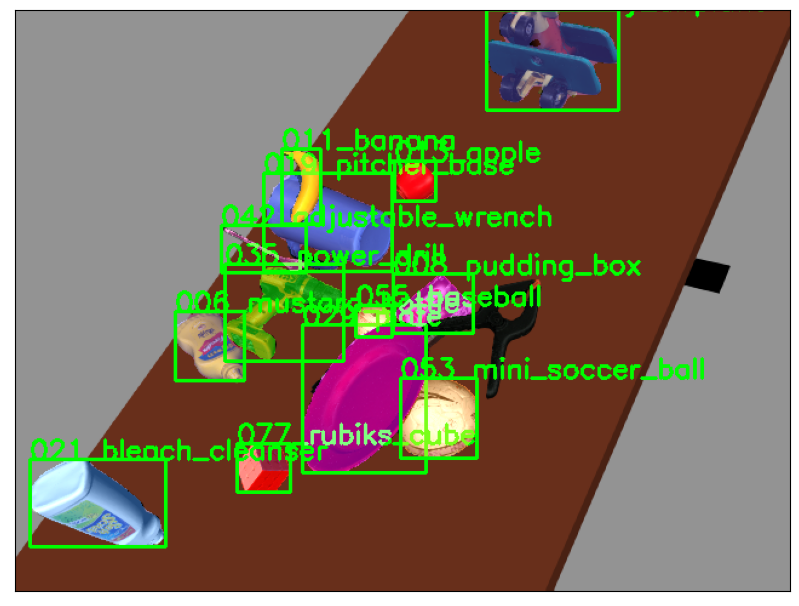

In [20]:
rand_i = np.random.choice(len(test))
segment_instance(dataset_test[rand_i][0],rgbs[test[rand_i]],confidence=0.7)

## Pose Prediction Model

### FGR and RANSAC

In [21]:
confidence = 0.7
pred_masks = []
pred_obj_id = []
sub_pcs = []
for i,t in enumerate(tqdm(test)):
    masks, pred_boxes, pred_class,pred_label = get_prediction(dataset_test[i][0], confidence)
    
    pred_masks.append(masks)
    pred_obj_id.append(pred_label)
    
    
    rgb = rgbs[t]
    depth =depth_imgs[t]
    
    for j,mask in enumerate(masks):
        pc = depth[mask]
        pc = pc[np.logical_not(np.isnan(pc[:,-1]))] 
        sub_pcs.append([pc,pred_label[j],t])

  0%|          | 0/100 [00:00<?, ?it/s]

In [133]:
predicted_poses_fgr = {}
predicted_poses_ransac = {}
for mpc in tqdm(sub_pcs):
    if not mpc[-1] in predicted_poses_fgr.keys():
        predicted_poses_fgr[mpc[-1]] = []
        predicted_poses_ransac[mpc[-1]] = []
    
    source = o3d.geometry.PointCloud()
    source.points = o3d.utility.Vector3dVector(mpc[0]-mpc[0].min(0))
    target = o3d.geometry.PointCloud()
    target.points = o3d.utility.Vector3dVector(reference_point_clouds[mpc[1]-1][0])
    target_down = target.voxel_down_sample(0.002)


    target_down.estimate_normals(o3d.geometry.KDTreeSearchParamHybrid(radius=1.0, max_nn=10))
    source.estimate_normals(o3d.geometry.KDTreeSearchParamHybrid(radius=1.0, max_nn=10))

    target_fpfh = o3d.pipelines.registration.compute_fpfh_feature(target_down, o3d.geometry.KDTreeSearchParamHybrid(radius=1.0, max_nn=30))
    source_fpfh = o3d.pipelines.registration.compute_fpfh_feature(source, o3d.geometry.KDTreeSearchParamHybrid(radius=1.0, max_nn=30))

    distance_threshold = 0.002

    result = o3d.pipelines.registration.registration_ransac_based_on_feature_matching(
            target_down, source, target_fpfh, source_fpfh, True,
            distance_threshold,
            o3d.pipelines.registration.TransformationEstimationPointToPoint(False),
            3, [
                o3d.pipelines.registration.CorrespondenceCheckerBasedOnEdgeLength(
                    0.9),
                o3d.pipelines.registration.CorrespondenceCheckerBasedOnDistance(
                    distance_threshold)
            ], o3d.pipelines.registration.RANSACConvergenceCriteria(100000, 0.99))


    result = o3d.pipelines.registration.registration_icp(
            target_down, source, distance_threshold, result.transformation,
            o3d.pipelines.registration.TransformationEstimationPointToPlane())
    
    R = result.transformation[0:3,0:3]
    t = result.transformation[0:3,-1] + mpc[0].min(0)
    
    predicted_poses_ransac[mpc[-1]].append([R,t,mpc[1]])
    
    result = o3d.pipelines.registration.registration_fgr_based_on_feature_matching(
            target_down, source, target_fpfh, source_fpfh,
            o3d.pipelines.registration.FastGlobalRegistrationOption(
                maximum_correspondence_distance=distance_threshold))
    
    result = o3d.pipelines.registration.registration_icp(
            target_down, source, distance_threshold, result.transformation,
            o3d.pipelines.registration.TransformationEstimationPointToPlane())
    
    R = result.transformation[0:3,0:3]
    t = result.transformation[0:3,-1] + mpc[0].min(0)
    
    predicted_poses_fgr[mpc[-1]].append([R,t,mpc[1]])

  0%|          | 0/952 [00:00<?, ?it/s]

In [134]:
ADD_fgr = 0.0
ADD_ransac = 0.0
count = 0
sym = [1,2,10,13,14]
for k in tqdm(predicted_poses_fgr.keys()):
    
    gt_classes = []
    gt_poses = []
    for g_p in gt[k]:
        gt_classes.append(g_p['obj_id'])
        gt_poses.append([np.reshape(g_p['cam_R_m2c'],[3,3]),np.array(g_p['cam_t_m2c'])])
        count += 1
    
    for p_p in predicted_poses_fgr[k]:
        if p_p[-1] in gt_classes:
            R_p = p_p[0]
            t_P = p_p[1]
            idx = gt_classes.index(p_p[-1])
            R = gt_poses[idx][0]
            t = gt_poses[idx][1]
            
            ref_pc = reference_point_clouds[p_p[-1]-1][0]
            
            target = (R @ ref_pc.T).T + t
            pred = (R_p @ ref_pc.T).T + t_P
            
            if p_p[-1] in sym:
                L_p = torch.cdist(torch.Tensor(target).to(device),torch.Tensor(pred).to(device)).min(-1)[0].mean() * 1000.0
                L_p = L_p.cpu().detach().numpy()
            else:
                L_p = np.linalg.norm(target-pred,axis=-1).mean()*1000.0
                
            if L_p <= 0.1 * diameters[p_p[-1]-1]:
                ADD_fgr += 1
    
    for p_p in predicted_poses_ransac[k]:
        if p_p[-1] in gt_classes:
            R_p = p_p[0]
            t_P = p_p[1]
            idx = gt_classes.index(p_p[-1])
            R = gt_poses[idx][0]
            t = gt_poses[idx][1]
            
            ref_pc = reference_point_clouds[p_p[-1]-1][0]
            
            target = (R@ref_pc.T).T + t
            pred = (R_p@ref_pc.T).T + t_P
            
            if p_p[-1] in sym:
                L_p = torch.cdist(torch.Tensor(target).to(device),torch.Tensor(pred).to(device)).min(-1)[0].mean() * 1000.0
                L_p = L_p.cpu().detach().numpy()
            else:
                L_p = np.linalg.norm(target-pred,axis=-1).mean()*1000.0
                
            if L_p <= 0.1 * diameters[p_p[-1]-1]:
                ADD_ransac += 1
                
print('RANSAC ADD(-S): %f' % (ADD_ransac/count))
print('FGR ADD(-S): %f' % (ADD_fgr/count))

  0%|          | 0/100 [00:00<?, ?it/s]

RANSAC ADD(-S): 0.535565
FGR ADD(-S): 0.406904


### Super 4PCs

In [22]:
import subprocess

os.system('rm -r ./Super4PCs/temp/')
os.system('mkdir ./Super4PCs/temp/')

0

In [23]:
predicted_poses_4PCs = {}
to_do = []
for i,mpc in enumerate(tqdm(sub_pcs)):
    
    source = o3d.geometry.PointCloud()
    source.points = o3d.utility.Vector3dVector(mpc[0]-mpc[0].min(0))
    source.estimate_normals(o3d.geometry.KDTreeSearchParamHybrid(radius=1.0, max_nn=10))

    normals = np.array(source.normals)
    normals[normals[:,-1]>0] *= -1 
    source.normals = o3d.utility.Vector3dVector(normals)

    radii = [0.001, 0.002, 0.004, 0.01]
    rec_mesh = o3d.geometry.TriangleMesh.create_from_point_cloud_ball_pivoting(
        source, o3d.utility.DoubleVector(radii))
    o3d.io.write_triangle_mesh('./Super4PCs/temp/mpc_%i.obj'%i,rec_mesh)
    to_do.append(i)

  0%|          | 0/952 [00:00<?, ?it/s]

[Open3D WARNING] Write OBJ can not include triangle normals.
[Open3D WARNING] Write OBJ can not include triangle normals.
[Open3D WARNING] Write OBJ can not include triangle normals.
[Open3D WARNING] Write OBJ can not include triangle normals.
[Open3D WARNING] Write OBJ can not include triangle normals.
[Open3D WARNING] Write OBJ can not include triangle normals.
[Open3D WARNING] Write OBJ can not include triangle normals.
[Open3D WARNING] Write OBJ can not include triangle normals.
[Open3D WARNING] Write OBJ can not include triangle normals.
[Open3D WARNING] Write OBJ can not include triangle normals.
[Open3D WARNING] Write OBJ can not include triangle normals.
[Open3D WARNING] Write OBJ can not include triangle normals.
[Open3D WARNING] Write OBJ can not include triangle normals.
[Open3D WARNING] Write OBJ can not include triangle normals.
[Open3D WARNING] Write OBJ can not include triangle normals.
[Open3D WARNING] Write OBJ can not include triangle normals.
[Open3D WARNING] Write O

In [29]:
def process_mcp(i):
    mpc = sub_pcs[i]
    result = subprocess.run(('./Super4PCs/Super4PCS -i ./Super4PCs/temp/mpc_%i.obj ./Super4PCs/PreProcessedMeshes/Custom/obj_%02d.obj -o 0.7 -t 20 -d 0.01 -n 150'%(i,mpc[1])).split(), stdout=subprocess.PIPE)
    T = str(result.stdout).split('.obj:')[1].split('\\n')[1:5]
    T_final = []
    for t in T:
        T_final.append([])
        for v in t.split():
            T_final[-1].append(float(v))
    T_final = np.array(T_final)
    
    R = T_final[0:3,0:3]
    t = T_final[0:3,-1] + mpc[0].min(0)
    
    return [R,t],mpc[-1]

In [30]:
def run_imap_multiprocessing(func, argument_list, show_prog = True):
    pool = mp.Pool(processes=mp.cpu_count())
    
    if show_prog:            
        result_list_tqdm = []
        for result in tqdm(pool.imap(func=func, iterable=argument_list), total=len(argument_list),position=0, leave=True):
            result_list_tqdm.append(result)
    else:
        result_list_tqdm = []
        for result in pool.imap(func=func, iterable=argument_list):
            result_list_tqdm.append(result)

    return result_list_tqdm

In [31]:
computed = run_imap_multiprocessing(process_mcp,to_do)

  0%|          | 0/952 [00:00<?, ?it/s]

In [32]:
predicted_poses_4pcs = {}
for idx,i in enumerate(tqdm(to_do)):
    mpc = sub_pcs[i]
    if not mpc[-1] in predicted_poses_4pcs.keys():
        predicted_poses_4pcs[mpc[-1]] = []

    R,t = computed[idx][0]

    predicted_poses_4pcs[mpc[-1]].append([R,t,mpc[1]])

  0%|          | 0/952 [00:00<?, ?it/s]

In [33]:
ADD_4pcs = 0.0
count = 0
sym = [1,2,10,13,14]
for k in tqdm(predicted_poses_4pcs.keys()):
    
    gt_classes = []
    gt_poses = []
    for g_p in gt[k]:
        gt_classes.append(g_p['obj_id'])
        gt_poses.append([np.reshape(g_p['cam_R_m2c'],[3,3]),np.array(g_p['cam_t_m2c'])])
        count += 1
    
    for p_p in predicted_poses_4pcs[k]:
        if p_p[-1] in gt_classes:
            R_p = p_p[0]
            t_P = p_p[1]
            idx = gt_classes.index(p_p[-1])
            R = gt_poses[idx][0]
            t = gt_poses[idx][1]
            
            ref_pc = reference_point_clouds[p_p[-1]-1][0]
            
            target = (R @ ref_pc.T).T + t
            pred = (R_p @ ref_pc.T).T + t_P
            
            if p_p[-1] in sym:
                L_p = torch.cdist(torch.Tensor(target).to(device),torch.Tensor(pred).to(device)).min(-1)[0].mean() * 1000.0
                L_p = L_p.cpu().detach().numpy()
            else:
                L_p = np.linalg.norm(target-pred,axis=-1).mean()*1000.0
                
            if L_p <= 0.1 * diameters[p_p[-1]-1]:
                ADD_4pcs += 1
                
print('Super4PCs ADD(-S): %f' % (ADD_4pcs/count))

  0%|          | 0/100 [00:00<?, ?it/s]

Super4PCs ADD(-S): 0.573222
